In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import ipywidgets as widgets
from IPython.display import display

In [3]:
pressure = float(input("Enter ambient pressure (0.01 or 1.01325): "))

if pressure == 0.01:
    data = pd.read_csv("Vacum_Statistics.csv")
    pressure_type = "Vacuum"
else:  # pressure is 1.01325 here
    data = pd.read_csv("Ground_Statistics.csv")
    pressure_type = "Ground"

#
print(f"Selected ambient pressure: {pressure} bar ({pressure_type})")

Enter ambient pressure (0.01 or 1.01325):  0.01


Selected ambient pressure: 0.01 bar (Vacuum)


In [4]:
fuel_classes = {
    "LH2": "Cryogenic fuel", #High performance, source petroluem deposits plus organic wastes
    "CH4": "Cryogenic fuel",
    "Ethane": "Cryogenic fuel",
    "NH3": "Cryogenic fuel",

    "RP1": "Storable hydrocarbon", #Liquid at ambient conditions
    "JP10": "Storable hydrocarbon",
    "Syntin": "Storable hydrocarbon",
    "Ethanol": "Storable hydrocarbon",
    "Methanol": "Storable hydrocarbon",
    "Paraffin": "Storable hydrocarbon",
    "Aniline": "Storable hydrocarbon",

    "UDMH": "Storable hypergolic fuels", # Ignite on contact with NTO
    "MMH": "Storable hypergolic fuels",
    "Hydrazine": "Storable hypergolic fuels",
    "Hydrazine_M": "Storable hypergolic fuels",
    "Aerozine50": "Storable hypergolic fuels",
    "UH25": "Storable hypergolic fuels",
    "Tonka250": "Storable hypergolic fuels",

    "H2O2_98": "Monopropellants",
    "LMP103S": "Monopropellants",

    "PBAN": "Solid fuels", #decompose without external oxidizer
    "HTPB_Hybrid": "Solid fuels",
    "DB_Solid": "Solid fuels",
    
    "APCP": "Solid composite"  #Fuel + oxidizer in one grain
}

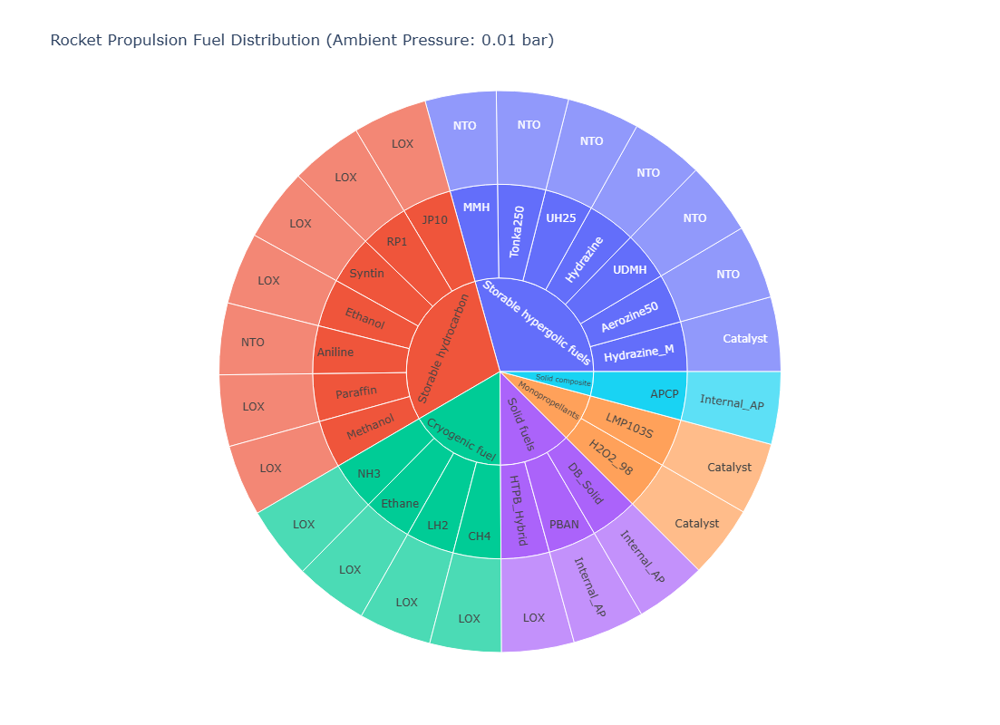

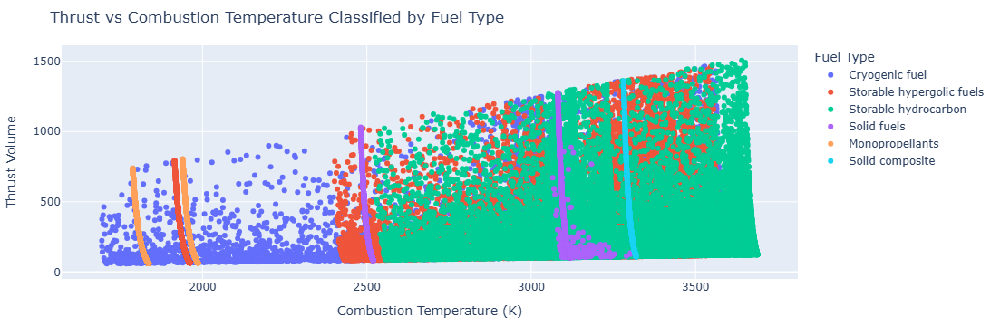

In [9]:
Proportions_System_data = pd.read_csv(" propulsion system data/rocket_propulsion_dataset_v1.csv")

Proportions_System_data["fuel_class"] = Proportions_System_data["fuel_type"].map(fuel_classes)
# Maping the fuel types to fuel classes dictionary


if 'ambient_pressure_bar' in Proportions_System_data.columns: 
    if pressure == 0.01:
        Proportions_System_data['ambient_pressure_bar'] = 0.01 
    else: 
        Proportions_System_data['ambient_pressure_bar'] = 1.01325 
        # Delete the column afterward if you want only the modified data to remain 
    Proportions_System_data.drop(columns=['ambient_pressure_bar'], inplace=True)

ambient_pressure = pressure

# Sunburst plot : mOdified to three layers 
fig_sunburst = px.sunburst(
    Proportions_System_data,
    path=["fuel_class", "fuel_type", "oxidizer_type"],
    title=f"Rocket Propulsion Fuel Distribution (Ambient Pressure: {ambient_pressure} bar)"
)
fig_sunburst.update_layout(width=1000,height=800)
fig_sunburst.show()

fig = go.Figure()

for fuel in data["fuel_type"].unique():
    subset = data[data["fuel_type"] == fuel]
    fig.add_trace(
        go.Scatter(x=subset["combustion_temperature_K"], y=subset["thrust_volume"], mode="markers", name=str(fuel))
    )

fig.update_xaxes(title="Combustion Temperature (K)")
fig.update_yaxes(title="Thrust Volume")
fig.update_layout(
    title="Thrust vs Combustion Temperature Classified by Fuel Type",
    legend_title="Fuel Type",
    margin=dict(t=50, l=40, r=40, b=40),
)

fig.show()

In [ ]:
fig = go.Figure()

for fuel in data['fuel_type'].unique():
    subset = data[data['fuel_type'] == fuel].sort_values('thrust_volume')
    subset['cumulative_mean_stability'] = subset['combustion_stability_margin'].expanding().mean()

    fig.add_trace(
        go.Scatter(x=subset['thrust_volume'], y=subset['cumulative_mean_stability'], mode='lines+markers', name=fuel)
    )

fig.update_xaxes(title='Thrust Volume')
fig.update_yaxes(title='Cumulative Mean Combustion Stability Margin')
fig.update_layout(title='Cumulative Mean Combustion Stability Margin vs Thrust Volume by Fuel Type', margin=dict(t=50, l=40, r=40, b=40), legend_title='Fuel Type')
fig.show()

In [ ]:
window_size = 5
for fuel in data['fuel_type'].unique():
    subset = data[data['fuel_type'] == fuel].sort_values('thermochemical_power_index')
    subset['rolling_stability'] = subset['combustion_stability_margin'].rolling(window=window_size, min_periods=1).mean()

    fig.add_trace(
        go.Scatter(x=subset['thermochemical_power_index'], y=subset['rolling_stability'],
                   mode='lines', name=fuel)
    )

fig.update_xaxes(title='Thermochemical Power Index')
fig.update_yaxes(title='Rolling Mean Combustion Stability Margin')
fig.update_layout(title=f'Rolling Mean Stability vs Thermochemical Power by Fuel Type (window={window_size})',
                  margin=dict(t=50, l=40, r=40, b=40), legend_title='Fuel Type', height=600)
fig.show()

In [ ]:
for fuel_class in data['fuel_type'].unique():
    subset = data[data['fuel_type'] == fuel_class].sort_values('pressure_isp_gamma_index')

    x = subset['pressure_isp_gamma_index'].values
    y = subset['combustion_stability_margin'].values

    coeffs = np.polyfit(x, y, 1)
    y_fit = np.polyval(coeffs, x)

    fig.add_trace(go.Scatter(x=x, y=y_fit, mode='lines', name=fuel_class))

fig.update_xaxes(title='pressure_isp_gamma_index')
fig.update_yaxes(title='Combustion Stability Margin')
fig.update_layout(title='Trend of Combustion Stability vs Chamber Pressure by Fuel Class',
                  legend_title='Fuel Class', margin=dict(t=50, l=40, r=40, b=40), height=600)
fig.show()


In [ ]:
for fuel_class in data['fuel_type'].unique():
    subset = data[data['fuel_type'] == fuel_class].sort_values('pressure_isp_gamma_index')

    x = subset['pressure_isp_gamma_index'].values
    y = subset['combustion_stability_margin'].values

    coeffs = np.polyfit(x, y, 1)
    y_fit = np.polyval(coeffs, x)

    fig.add_trace(go.Scatter(x=x, y=y_fit, mode='lines', name=fuel_class))

fig.update_xaxes(title='pressure_isp_gamma_index')
fig.update_yaxes(title='Combustion Stability Margin')
fig.update_layout(title='Trend of Combustion Stability vs Chamber Pressure by Fuel Class',
                  legend_title='Fuel Class', margin=dict(t=50, l=40, r=40, b=40), height=600)
fig.show()

In [17]:
# One dropdown only (enforced: no "All")
fuel_dropdown = widgets.Dropdown(
    options=sorted(data["fuel_type"].unique()),
    description="Fuel:",
    layout=widgets.Layout(width="320px")
)

out = widgets.Output()

def draw_dashboard(fuel):
    # Filter once (no copy, no dropna)
    df = data[data["fuel_type"] == fuel]

    # Fresh figure every time -> prevents “overdrawing”
    fig = make_subplots(
        rows=2, cols=2,
        vertical_spacing=0.12,
        horizontal_spacing=0.10,
        subplot_titles=[
            "Thrust vs Combustion Temperature",
            "Stability vs Pressure Index (Trend)",
            "Cumulative Mean Stability vs Thrust",
            "Rolling Mean Stability vs Thermochemical Index",
        ]
    )

    # ---------------------------
    # (1,1) Thrust vs Combustion Temperature
    # ---------------------------
    fig.add_trace(
        go.Scattergl(
            x=df["combustion_temperature_K"],
            y=df["thrust_volume"],
            mode="markers",
            name=fuel,
            showlegend=False
        ),
        row=1, col=1
    )
    fig.update_xaxes(title_text="Combustion Temperature (K)", row=1, col=1)
    fig.update_yaxes(title_text="Thrust Volume", row=1, col=1)

    # ---------------------------
    # (1,2) Stability vs Pressure Index (Trend line)
    # ---------------------------
    # Keep your same logic: polyfit on sorted x
    df_p = df.sort_values("pressure_isp_gamma_index")
    x = df_p["pressure_isp_gamma_index"].values
    y = df_p["combustion_stability_margin"].values

    if len(x) >= 2:
        c = np.polyfit(x, y, 1)
        y_fit = np.polyval(c, x)
        fig.add_trace(
            go.Scatter(
                x=x, y=y_fit,
                mode="lines",
                name="Trend",
                showlegend=False
            ),
            row=1, col=2
        )
    else:
        fig.add_trace(
            go.Scattergl(
                x=x, y=y,
                mode="markers",
                name="Points",
                showlegend=False
            ),
            row=1, col=2
        )

    fig.update_xaxes(title_text="Pressure–Isp–Gamma Index", row=1, col=2)
    fig.update_yaxes(title_text="Combustion Stability Margin", row=1, col=2)

    # ---------------------------
    # (2,1) Cumulative Mean Stability vs Thrust
    # ---------------------------
    df_t = df.sort_values("thrust_volume")
    cum_mean_stab = df_t["combustion_stability_margin"].expanding().mean()

    fig.add_trace(
        go.Scatter(
            x=df_t["thrust_volume"],
            y=cum_mean_stab,
            mode="lines",
            name="Cumulative Mean",
            showlegend=False
        ),
        row=2, col=1
    )
    fig.update_xaxes(title_text="Thrust Volume", row=2, col=1)
    fig.update_yaxes(title_text="Cumulative Mean Stability Margin", row=2, col=1)

    # ---------------------------
    # (2,2) Rolling Mean Stability vs Thermochemical Index
    # ---------------------------
    window_size = 5
    df_th = df.sort_values("thermochemical_power_index")
    roll_stab = df_th["combustion_stability_margin"].rolling(window=window_size, min_periods=1).mean()

    fig.add_trace(
        go.Scatter(
            x=df_th["thermochemical_power_index"],
            y=roll_stab,
            mode="lines",
            name=f"Rolling Mean (w={window_size})",
            showlegend=False
        ),
        row=2, col=2
    )
    fig.update_xaxes(title_text="Thermochemical Power Index", row=2, col=2)
    fig.update_yaxes(title_text="Rolling Mean Stability Margin", row=2, col=2)

    # ---------------------------
    # Layout: fill notebook area
    # ---------------------------
    fig.update_layout(
        title=f"Rocket Propulsion Dashboard — Fuel: {fuel}",
        autosize=True,
        height=900,
        margin=dict(t=80, l=60, r=30, b=60),
    )

    return fig

def refresh(change=None):
    with out:
        out.clear_output(wait=True)   # prevents stacking/overdrawing output
        fig = draw_dashboard(fuel_dropdown.value)
        fig.show(config={"responsive": True})

fuel_dropdown.observe(refresh, names="value")

display(widgets.VBox([fuel_dropdown, out]))
refresh()

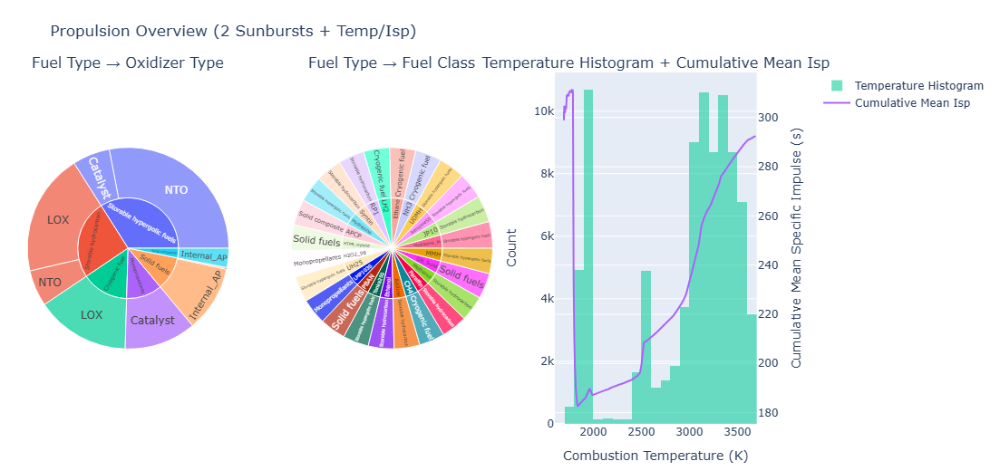

In [19]:

fig = make_subplots(
    rows=1, cols=3,
    horizontal_spacing=0.08,
    specs=[
        [{"type": "domain"}, {"type": "domain"}, {"secondary_y": True}]
    ],
    subplot_titles=[
        "Fuel Type → Oxidizer Type",
        "Fuel Type → Fuel Class",
        "Temperature Histogram + Cumulative Mean Isp"
    ]
)

# (1,1) Sunburst: fuel_type -> oxidizer_type
sun1 = px.sunburst(data, path=["fuel_type", "oxidizer_type"])
for tr in sun1.data:
    fig.add_trace(tr, row=1, col=1)

# (1,2) Sunburst: fuel_type -> fuel_class
# If you prefer fuel_class -> fuel_type, swap the order in path
sun2 = px.sunburst(Proportions_System_data, path=["fuel_type", "fuel_class"])
for tr in sun2.data:
    fig.add_trace(tr, row=1, col=2)

# (1,3) Histogram + cumulative mean Isp
df_sorted = data.sort_values("combustion_temperature_K")
cum_mean_isp = df_sorted["specific_impulse_s"].expanding().mean()

fig.add_trace(
    go.Histogram(
        x=df_sorted["combustion_temperature_K"],
        nbinsx=30,
        opacity=0.55,
        name="Temperature Histogram"
    ),
    row=1, col=3, secondary_y=False
)

fig.add_trace(
    go.Scatter(
        x=df_sorted["combustion_temperature_K"],
        y=cum_mean_isp,
        mode="lines",
        name="Cumulative Mean Isp"
    ),
    row=1, col=3, secondary_y=True
)

fig.update_xaxes(title_text="Combustion Temperature (K)", row=1, col=3)
fig.update_yaxes(title_text="Count", row=1, col=3, secondary_y=False)
fig.update_yaxes(title_text="Cumulative Mean Specific Impulse (s)", row=1, col=3, secondary_y=True)

fig.update_layout(
    title="Propulsion Overview (2 Sunbursts + Temp/Isp)",
    height=520,
    autosize=True,
    margin=dict(t=80, l=30, r=30, b=30),
    showlegend=True  # keep if you want legend for the histogram/line; set False to hide all legends
)

fig.show(config={"responsive": True})